# Recommendation Systems with TensorFlow 2.x

This Colab notebook complements the course on [Recommendation Systems](https://developers.google.com/machine-learning/recommendation/). Specifically, we'll be using matrix factorization to learn user and video game embeddings.



## Setup

Let's get started by importing the required packages.

In [1]:
import numpy as np
import pandas as pd
import collections

from mpl_toolkits.mplot3d import Axes3D
from IPython import display
from matplotlib import pyplot as plt
import html
import re

import sklearn
import sklearn.manifold

import tensorflow as tf

# Add some convenience functions to Pandas DataFrame.
pd.options.display.max_rows = 10
pd.options.display.float_format = '{:.3f}'.format

In [2]:
import altair as alt
alt.data_transformers.enable('default', max_rows=None)
alt.renderers.enable('colab')

RendererRegistry.enable('colab')

# Step 1: Download ratings/reviews dataset

Note that even though the dataset from UCSD is more recent, but its a lot more problematic. The meta data corresponding to the reviews data has missing categories, etc.

For now continuing to use the older dataset from Stanford.

In [3]:
import json

ratings_vidgames = []
with open('/home/shiv/Documents/DataScience/Capstone/Data/stanford/reviews_Video_Games_5.json', 'r') as f:
    for line in f:
        review = json.loads(line) # overall, verified, reviewerID, asin, unixReviewTime, reviewText, summary
        ratings_vidgames.append([review['reviewerID'], review['asin'], 
                                 review['overall'], review['unixReviewTime']])
print(len(ratings_vidgames))

231780


In [4]:
ratings_df = pd.DataFrame(ratings_vidgames, columns = ['reviewerID', 'asin', 'rating', 'unixReviewTime'])
ratings_df.head()

,reviewerID,asin,rating,unixReviewTime
0,A2HD75EMZR8QLN,0700099867,1.000,1341792000
1,A3UR8NLLY1ZHCX,0700099867,4.000,1372550400
2,A1INA0F5CWW3J4,0700099867,1.000,1403913600
3,A1DLMTOTHQ4AST,0700099867,3.000,1315958400
4,A361M14PU2GUEG,0700099867,4.000,1308009600


In [5]:
ratings_df['reviewerID'].nunique(), ratings_df['asin'].nunique() # 24303, 10672 from the Stanford dataset

(24303, 10672)

# Step 2: Replace reviewerID with an ID starting from 0

In [6]:
reviewers_dict = {}
reviewer_id = 0
for _, row in ratings_df.iterrows():
    if row['reviewerID'] not in reviewers_dict:
        reviewers_dict[row['reviewerID']] = reviewer_id
        reviewer_id += 1

In [7]:
ratings_df['userID'] = ratings_df['reviewerID'].apply(lambda x: reviewers_dict[x])

# Step 3: Get the original meta information (for the entire dataset)

In [8]:
items_orig = []
with open('/home/shiv/Documents/DataScience/Capstone/Data/stanford/meta_Video_Games.json', 'r') as f:
    for line in f:
        info = json.loads(line) # category (list), main_cat, title, asin, price, imageURLHighRes
                                # tech1, tech2, brand, description, feature, 
                                # fit, rank,
                                # similar_item, also_buy, also_view, date
        items_orig.append([info['asin'], info['main_cat'],
                         info['title'], info['price']]) # get title and price
print(len(items_orig))

84819


In [9]:
items_orig_df = pd.DataFrame(items_orig, columns = ['asin', 'main_cat', 'title', 'price'])

# duplicate asin count = 84819 - 71911, no missing asin though!
items_orig_df.shape, items_orig_df['asin'].nunique(), items_orig_df['asin'].isna().sum()

((84819, 4), 71911, 0)

# Step 4: Get the meta information for 5-core

In [10]:
items = []
with open('/home/shiv/Documents/DataScience/Capstone/Data/stanford/meta_Video_Games_5.json', 'r') as f:
    for line in f:
        lst_vals = []
        line_new = eval(line)
        lst_vals.append(line_new['asin'])
        lst_vals.append(line_new['categories'][0][0])
        if 'description' in line_new:
            lst_vals.append(line_new['description'])
        else:
            lst_vals.append('')
        if 'price' in line_new:
            lst_vals.append(line_new['price'])
        else:
            lst_vals.append('')
        items.append(lst_vals)

print(len(items))

50953


In [11]:
items_df = pd.DataFrame(items, columns = ['asin', 'category', 'description', 'price'])

# no duplicates, weird categories though!!
items_df.shape, items_df['category'].unique(), items_df['asin'].nunique(), items_df['asin'].isna().sum()

((50953, 4),
 array(['Video Games', 'Home & Kitchen', 'CDs & Vinyl', 'Software',
        'Toys & Games', 'Movies & TV', 'Cell Phones & Accessories',
        'Sports & Outdoors', 'Automotive', 'Electronics',
        'Tools & Home Improvement', 'Office Products', 'Purchase Circles',
        'Musical Instruments', 'Gift Cards', 'Arts, Crafts & Sewing',
        'Grocery & Gourmet Food', 'Apps for Android', 'Kindle Store'],
       dtype=object),
 50953,
 0)

# Step 5: Merge the meta dataframes (5-core, original)

In [12]:
items_merged_df = pd.merge(items_df, items_orig_df, how = 'left',on='asin')
print(items_merged_df.shape)
items_merged_df

(61776, 7)


,asin,category,description,price_x,main_cat,title,price_y
0,0078764343,Video Games,Brand new sealed!,37.980,Video Games,Medal of Honor: Warfighter - Includes Battlefi...,"\n\t\t\t\t\t\t\t\t\t\t\t\t<span class=""vertica..."
1,043933702X,Video Games,In Stock NOW. Eligible for FREE Super Saving ...,23.500,Video Games,Need for Speed Porsche Unleashed,$49.98
2,0439339987,Video Games,Grandma Groupers kelp seeds are missing and wi...,8.950,Video Games,Freddi Fish and the Case of The Missing Kelp S...,
3,0439342260,Video Games,This software is BRAND NEW. Packaging may diff...,,Video Games,Ice Cream Truck,
4,0439339960,Video Games,a scholastic clubs fairs cd rom game,,Video Games,A to Zap,
...,...,...,...,...,...,...,...
61771,B00LCLV730,Video Games,,,NaN,NaN,NaN
61772,B00LGBKSK4,Video Games,The Havit X1 Waterproof USB Gaming Keyboard ha...,36.990,NaN,NaN,NaN
61773,B00LGBJIQ4,Video Games,The Havit X1 Waterproof USB Gaming Keyboard ha...,35.990,Computers,HAVIT&reg; X1 Waterproof USB Gaming Keyboard (...,
61774,B00LI0VTS8,Video Games,,,Video Games,My Life Story: Adventures [Download],


# Step 6: Drop duplicates from the merged dataframe

In [13]:
items_merged_df.drop_duplicates(inplace=True)
items_merged_df.shape # Note back to the 5-core dataframe rows

(50953, 7)

## Keep the merged dataframe without duplicates from here on

In [14]:
items_df = items_merged_df
items_df.head()

,asin,category,description,price_x,main_cat,title,price_y
0,0078764343,Video Games,Brand new sealed!,37.980,Video Games,Medal of Honor: Warfighter - Includes Battlefi...,"\n\t\t\t\t\t\t\t\t\t\t\t\t<span class=""vertica..."
1,043933702X,Video Games,In Stock NOW. Eligible for FREE Super Saving ...,23.500,Video Games,Need for Speed Porsche Unleashed,$49.98
2,0439339987,Video Games,Grandma Groupers kelp seeds are missing and wi...,8.950,Video Games,Freddi Fish and the Case of The Missing Kelp S...,
3,0439342260,Video Games,This software is BRAND NEW. Packaging may diff...,,Video Games,Ice Cream Truck,
4,0439339960,Video Games,a scholastic clubs fairs cd rom game,,Video Games,A to Zap,


# Step 7: Data cleanup

1. remove html tags
2. try to get a price from the two columns price_x, price_y; if not possible, price is '$$$'
3. try to get a title from the two columns title_x, title_y; if not possible, title is 'Unknown'

In [15]:
def cleanhtml(raw_html):
  cleanr = re.compile('<.*?>')
  cleantext = re.sub(cleanr, '', raw_html)
  return cleantext

def is_number(s):
    try:
        float(s)
        return True
    except ValueError:
        return False

def remove_html(row): 
    # row['main_cat_orig'] = html.unescape(row['main_cat'])#[html.unescape(x) for x in row['category']]
    # row['category'] = [cleanhtml(x) for x in row['category'] if cleanhtml(x) != '']
    p_y = str(row['price_y']).strip()
    if p_y.startswith('$'):
        row['price'] = p_y
    else:
        p_x = str(row['price_x']).strip()
        if is_number(p_x):
            row['price'] = '$' + p_x
        else:
            row['price'] = '$$$'
    if pd.isna(row['title']):
        desc = cleanhtml(row['description'])
        desc = html.unescape(desc)
        if len(desc) == 0:
            # print(row['asin'])
            row['title'] = 'Unknown'
        else:
            row['title'] = desc
    elif len(row['title']) == 0:
        # print(row['asin'])
        row['title'] = 'Unknown'
    # row['main_cat'] = row['category'][0] if len(row['category']) else row['main_cat_orig']
    # row['second_cat'] = row['category'][1] if len(row['category']) > 1 else row['main_cat_orig']
    row['category'] = html.unescape(row['category'])
    return row

items_df = items_df.apply(remove_html, axis=1)

In [16]:
items_df['asin'].nunique(), ratings_df['asin'].nunique()

(50953, 10672)

# Step 8: Remove the items that have no ratings

In [17]:
asin_unique = ratings_df['asin'].unique()
items_df.set_index(['asin'], inplace=True)
items_df = items_df.loc[asin_unique]
items_df.reset_index(inplace=True)

In [18]:
# CAUTION: SLOW!!
# asin_unique = ratings_df['asin'].unique()
# vidgames_df = vidgames_df.groupby(['asin']).filter(lambda x: x['asin'].values[0] in asin_unique)

In [19]:
items_df.shape # only consist of items that have ratings

(10672, 8)

# Step 9: Replace asin with an item ID starting from 0

In [20]:
items_dict = {}
item_id = 0

for _, row in items_df.iterrows():
    if row['asin'] not in items_dict:
        items_dict[row['asin']] = item_id
        item_id += 1
    else:
        print("duplicate asin", row['asin'])
items_df['itemID'] = items_df['asin'].apply(lambda x: items_dict[x])

# Step 10: Drop unnecessary columns from items dataframe

In [21]:
items_df.drop(columns=['asin','description','main_cat','price_x','price_y'], inplace=True)
items_df.reset_index(inplace=True, drop=True)
items_df.head()

,category,title,price,itemID
0,Video Games,Dirt 3,$246.63,0
1,Video Games,USB Microphone for RockBand or Guitar Hero (PS...,$39.99,1
2,Video Games,Nintendo's thematic action-adventure sequel to...,$105.63,2
3,Video Games,Component AV Cable for Nintendo Wii to HDTV (B...,$6.05,3
4,Video Games,Tom Clancy's H.A.W.X 2,$49.99,4


# Step 11: Replace asin in ratings dataframe with ID from items_dict

In [22]:
ratings_df['itemID'] = ratings_df['asin'].apply(lambda x: items_dict[x] if x in items_dict else np.nan)

In [23]:
ratings_df['itemID'].isna().sum()

0

In [24]:
print(ratings_df.shape)
ratings_df.dropna(subset=['itemID'], inplace=True)
print(ratings_df.shape)

(231780, 6)
(231780, 6)


In [25]:
ratings_df.head()

,reviewerID,asin,rating,unixReviewTime,userID,itemID
0,A2HD75EMZR8QLN,0700099867,1.000,1341792000,0,0
1,A3UR8NLLY1ZHCX,0700099867,4.000,1372550400,1,0
2,A1INA0F5CWW3J4,0700099867,1.000,1403913600,2,0
3,A1DLMTOTHQ4AST,0700099867,3.000,1315958400,3,0
4,A361M14PU2GUEG,0700099867,4.000,1308009600,4,0


# Step 12: Drop unneccasary columns from ratings dataframe

In [26]:
ratings_df.drop(columns=['reviewerID', 'asin'], inplace=True)
ratings_df['itemID'] = ratings_df['itemID'].astype('int')
ratings_df.head()

,rating,unixReviewTime,userID,itemID
0,1.000,1341792000,0,0
1,4.000,1372550400,1,0
2,1.000,1403913600,2,0
3,3.000,1315958400,3,0
4,4.000,1308009600,4,0


### Utility function to split dataset into train, test sets

In [27]:
# Utility to split the data into training and test sets.
def split_dataframe(df, holdout_fraction=0.1):
  """Splits a DataFrame into training and test sets.
  Args:
    df: a dataframe.
    holdout_fraction: fraction of dataframe rows to use in the test set.
  Returns:
    train: dataframe for training
    test: dataframe for testing
  """
  test = df.sample(frac=holdout_fraction, replace=False)
  train = df[~df.index.isin(test.index)]
  return train, test

# EDA : Exploring the Items Dataset

Before we dive into model building, let's inspect our items dataset. It is usually helpful to understand the statistics of the dataset.

### Items & ratings

It is also useful to look at information about the items and their ratings.

In [28]:
def flatten_cols(df):
  df.columns = [' '.join(col).strip() for col in df.columns.values]
  return df

pd.DataFrame.flatten_cols = flatten_cols

items_ratings = items_df.merge(
    ratings_df
    .groupby('itemID', as_index=False)
    .agg({'rating': ['count', 'mean']})
    .flatten_cols(),
    on='itemID')

In [29]:
print("# users", ratings_df['userID'].nunique(), "# items", ratings_df['itemID'].nunique())

# users 24303 # items 10672


In [30]:
(items_ratings[['title', 'category', 'rating count', 'rating mean']]
 .sort_values('rating count', ascending=False)
 .head(10))

,title,category,rating count,rating mean
10054,PlayStation 4 500GB Console [Old Model][Discon...,Electronics,802,4.382
5390,PlayStation 3 Dualshock 3 Wireless Controller ...,Electronics,652,4.600
9267,Unknown,Video Games,517,4.603
7163,"With an Xbox LIVE Gold membership, take your X...",Gift Cards,465,4.753
3323,Wii,Video Games,447,4.463
8659,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
3536,Xbox 360 LIVE 1600 Points,Electronics,425,4.819
5489,Diablo III,Video Games,379,2.649
9402,Call of Duty: Black Ops II - Xbox 360,Video Games,365,3.614
1341,Halo - Xbox,Video Games,356,4.531


The following chart shows the distribution of the number of ratings and average rating.

In [31]:
cat_filter = alt.selection_multi(fields=['main_cat'])
cat_chart = alt.Chart().mark_bar().encode(
    x="count()",
    y=alt.Y('category'),
    color=alt.condition(
        cat_filter,
        alt.Color("category:N"),
        alt.value('lightgray'))
).properties(height=300, selection=cat_filter)

In [32]:
# A function that generates a histogram of filtered data.
def filtered_hist(field, label, filter):
  """Creates a layered chart of histograms.
  The first layer (light gray) contains the histogram of the full data, and the
  second contains the histogram of the filtered data.
  Args:
    field: the field for which to generate the histogram.
    label: String label of the histogram.
    filter: an alt.Selection object to be used to filter the data.
  """
  base = alt.Chart().mark_bar().encode(
      x=alt.X(field, bin=alt.Bin(maxbins=20), title=label),
      y="count()",
  ).properties(
      width=300,
  )
  return alt.layer(
      base.transform_filter(filter),
      base.encode(color=alt.value('lightgray'), opacity=alt.value(.7)),
  ).resolve_scale(y='independent')

# Display the number of ratings and average rating per item.
alt.hconcat(
    filtered_hist('rating count', '# ratings / game', cat_filter),
    filtered_hist('rating mean', 'mean game rating', cat_filter),
    cat_chart,
    data=items_ratings[items_ratings['rating count']<100])

alt.HConcatChart(...)

# Matrix Factorization

Our goal is to factorize the ratings matrix $A$ into the product of a user embedding matrix $U$ and items embedding matrix $V$, such that $A \approx UV^\top$ with
$U = \begin{bmatrix} u_{1} \\ \hline \vdots \\ \hline u_{N} \end{bmatrix}$ and
$V = \begin{bmatrix} v_{1} \\ \hline \vdots \\ \hline v_{M} \end{bmatrix}$.

Here
- $N$ is the number of users,
- $M$ is the number of items,
- $A_{ij}$ is the rating of the $j$th item by the $i$th user,
- each row $U_i$ is a $d$-dimensional vector (embedding) representing user $i$,
- each row $V_j$ is a $d$-dimensional vector (embedding) representing item $j$,
- the prediction of the model for the $(i, j)$ pair is the dot product $\langle U_i, V_j \rangle$.




### Build a tf.SparseTensor representation of the Ratings Matrix.

In [33]:
ratings_df.head()

,rating,unixReviewTime,userID,itemID
0,1.000,1341792000,0,0
1,4.000,1372550400,1,0
2,1.000,1403913600,2,0
3,3.000,1315958400,3,0
4,4.000,1308009600,4,0


In [34]:
ratings_df[['userID', 'itemID']].values

array([[    0,     0],
       [    1,     0],
       [    2,     0],
       ...,
       [21853, 10671],
       [22651, 10671],
       [24272, 10671]])

In [35]:
ratings_df['rating'].values

array([1., 4., 1., ..., 1., 1., 1.])

In [36]:
def build_rating_sparse_tensor(ratings_df, numUsers=len(reviewers_dict), numGames=len(items_dict)):
  """
  Args:
    ratings_df: a pd.DataFrame with `userID`, `itemID` and `rating` columns.
  Returns:
    a tf.SparseTensor representing the ratings matrix.
  """
  indices = ratings_df[['userID', 'itemID']].values
  values = ratings_df['rating'].values
  return tf.SparseTensor(
      indices=indices,
      values=values,
      dense_shape=[numUsers, numGames])

In [37]:
# Try it out NxM matrix, N users, M items
tmp = build_rating_sparse_tensor(ratings_df)#, len(reviewers_dict), len(items_dict))
print(tmp.shape, len(reviewers_dict), len(items_dict), ratings_df.shape)
del tmp

(24303, 10672) 24303 10672 (231780, 4)


2022-07-27 17:42:13.327208: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-27 17:42:13.963842: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5742 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:01:00.0, compute capability: 8.6
2022-07-27 17:42:13.964254: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 6114 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3070, pci bus id: 0000:04:00.0, compute capability: 8.6


## Calculating the error

The model approximates the ratings matrix $A$ by a low-rank product $UV^\top$. We need a way to measure the approximation error. We'll start by using the Mean Squared Error of observed entries only (we will revisit this later). It is defined as

$$
\begin{align*}
\text{MSE}(A, UV^\top)
&= \frac{1}{|\Omega|}\sum_{(i, j) \in\Omega}{( A_{ij} - (UV^\top)_{ij})^2} \\
&= \frac{1}{|\Omega|}\sum_{(i, j) \in\Omega}{( A_{ij} - \langle U_i, V_j\rangle)^2}
\end{align*}
$$
where $\Omega$ is the set of observed ratings, and $|\Omega|$ is the cardinality of $\Omega$.



In [38]:
def sparse_mean_square_error(sparse_ratings, user_embeddings, item_embeddings):
  """
  Args:
    sparse_ratings: A SparseTensor rating matrix, of dense_shape [N, M]
    user_embeddings: A dense Tensor U of shape [N, k] where k is the embedding
      dimension, such that U_i is the embedding of user i.
    item_embeddings: A dense Tensor V of shape [M, k] where k is the embedding
      dimension, such that V_j is the embedding of item j.
  Returns:
    A scalar Tensor representing the MSE between the true ratings and the
      model's predictions.
  """
  predictions = tf.gather_nd(
      tf.matmul(user_embeddings, item_embeddings, transpose_b=True),
      sparse_ratings.indices)
  loss = tf.losses.mean_squared_error(sparse_ratings.values, predictions)
  return loss

Note: One approach is to compute the full prediction matrix $UV^\top$, then gather the entries corresponding to the observed pairs. The memory cost of this approach is $O(NM)$. 

For the MovieLens dataset, this is fine, as the dense $N \times M$ matrix is small enough to fit in memory ($N = 943$, $M = 1682$).

Another approach (given in the alternate solution below) is to only gather the embeddings of the observed pairs, then compute their dot products. The memory cost is $O(|\Omega| d)$ where $d$ is the embedding dimension. In our case, $|\Omega| = 10^5$, and the embedding dimension is on the order of $10$, so the memory cost of both methods is comparable. But when the number of users or items is much larger, the first approach becomes infeasible.

In [39]:
#@title Alternate Solution
def sparse_mean_square_error(sparse_ratings, user_embeddings, item_embeddings):
  """
  Args:
    sparse_ratings: A SparseTensor rating matrix, of dense_shape [N, M]
    user_embeddings: A dense Tensor U of shape [N, k] where k is the embedding
      dimension, such that U_i is the embedding of user i.
    item_embeddings: A dense Tensor V of shape [M, k] where k is the embedding
      dimension, such that V_j is the embedding of item j.
  Returns:
    A scalar Tensor representing the MSE between the true ratings and the
      model's predictions.
  """
  predictions = tf.reduce_sum(
      tf.gather(user_embeddings, sparse_ratings.indices[:, 0]) *
      tf.gather(item_embeddings, sparse_ratings.indices[:, 1]),
      axis=1)
  loss = tf.losses.mean_squared_error(sparse_ratings.values, predictions)
  return loss

# Training a Matrix Factorization model

## CFModel (Collaborative Filtering Model) helper class written in TensorFlow 2.x
This is a simple class to train a matrix factorization model using stochastic gradient descent.

The class constructor takes
- the user embeddings U (a `tf.Variable`).
- the item embeddings V, (a `tf.Variable`).
- a loss to optimize (a `tf.Tensor`).
- an optional list of metrics dictionaries, each mapping a string (the name of the metric) to a tensor. These are evaluated and plotted during training (e.g. training error and test error).

After training, one can access the trained embeddings using the `model.embeddings` dictionary.

Example usage:
```
U_var = ...
V_var = ...
loss = ...
model = CFModel(U_var, V_var, loss)
model.train(iterations=100, learning_rate=1.0)
user_embeddings = model.embeddings['user_id']
item_embeddings = model.embeddings['item_id']
```

In [40]:
class CFModel(object):
  """Simple class that represents a collaborative filtering model"""
  def __init__(self, embedding_vars, A_train, A_test):
    """Initializes a CFModel.
    Args:
      embedding_vars: A dictionary of tf.Variables.
      
    """
    self._embedding_vars = embedding_vars # {"user_id": U, "item_id": V}
    self._a_train = A_train
    self._a_test = A_test
    self._embeddings = {k: None for k in embedding_vars}

  @property
  def embeddings(self):
    """The embeddings dictionary."""
    return self._embeddings

  def train(self, num_iterations=100, learning_rate=1.0, plot_results=True,
            optimizer=tf.keras.optimizers.SGD):
    """Trains the model.
    Args:
      iterations: number of iterations to run.
      learning_rate: optimizer learning rate.
      plot_results: whether to plot the results at the end of training.
      optimizer: the optimizer to use. Default to GradientDescentOptimizer.
    Returns:
      The metrics dictionary evaluated at the last iteration.
    """

    opt = optimizer(learning_rate)

    iterations = []
    metrics_vals = [collections.defaultdict(list) for _ in ['train_loss', 'test_loss']]

    # Train and append results.
    results = {}
    for i in range(num_iterations + 1):
      with tf.GradientTape() as tape:
        train_loss = sparse_mean_square_error(self._a_train, self._embedding_vars['user_id'],
                                                             self._embedding_vars['item_id'])
      gradients = tape.gradient(train_loss, 
                                [self._embedding_vars['user_id'], self._embedding_vars['item_id']])
      opt.apply_gradients(zip(gradients, 
                              [self._embedding_vars['user_id'], self._embedding_vars['item_id']]))

      test_loss = sparse_mean_square_error(self._a_test, self._embedding_vars['user_id'],
                                                         self._embedding_vars['item_id'])
      results['train_loss'] = train_loss
      results['test_loss'] = test_loss
      if (i % 10 == 0) or i == num_iterations:
          print("\r iteration %d: " % i + ", ".join(
                ["%s=%f" % (k, v) for k, v in results.items()]),
                end='')
          iterations.append(i)
          for j, (k, v) in enumerate(results.items()):
            metrics_vals[j][k].append(v)

      for k, v in self._embedding_vars.items():
        self._embeddings[k] = v

    if plot_results:
        # Plot the metrics.
        fig = plt.figure()
        fig.set_size_inches(10, 8)
        ax = fig.add_subplot(1, 1, 1)
        for i, metric_vals in enumerate(metrics_vals):
          for k, v in metric_vals.items():
            ax.plot(iterations, v, label=k)
        ax.set_xlim([1, num_iterations])
        ax.legend()
    return results

### Build a Matrix Factorization model and train it

Using your `sparse_mean_square_error` function, write a function that builds a `CFModel` by creating the embedding variables and the train and test losses.

In [41]:
def build_model(ratings_df, embedding_dim=3, init_stddev=1.):
  """
  Args:
    ratings: a DataFrame of the ratings
    embedding_dim: the dimension of the embedding vectors.
    init_stddev: float, the standard deviation of the random initial embeddings.
  Returns:
    model: a CFModel.
  """

  # Split the ratings DataFrame into train and test.
  train_ratings, test_ratings = split_dataframe(ratings_df)

  # SparseTensor representation of the train and test datasets.
  A_train = build_rating_sparse_tensor(train_ratings)
  A_test = build_rating_sparse_tensor(test_ratings)
  
  # Initialize the embeddings using a normal distribution.
  U = tf.Variable(tf.random.normal(
      [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
  V = tf.Variable(tf.random.normal(
      [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))
  
 
  embeddings = {
      "user_id": U,
      "item_id": V
  }
  
  return CFModel(embeddings, A_train, A_test) #, [metrics])

# Hyperparameters

1. embedding dimension
2. learning rate
3. iterations

Trying different parameters (embedding dimension, learning rate, iterations). The training and test errors are plotted at the end of training. We can inspect these values to validate the hyper-parameters.

Note: by calling `model.train` again, the model will continue training starting from the current values of the embeddings.

 iteration 10000: train_loss=0.240823, test_loss=1.6959850

{'train_loss': <tf.Tensor: shape=(), dtype=float32, numpy=0.24082297>,
 'test_loss': <tf.Tensor: shape=(), dtype=float32, numpy=1.6959853>}

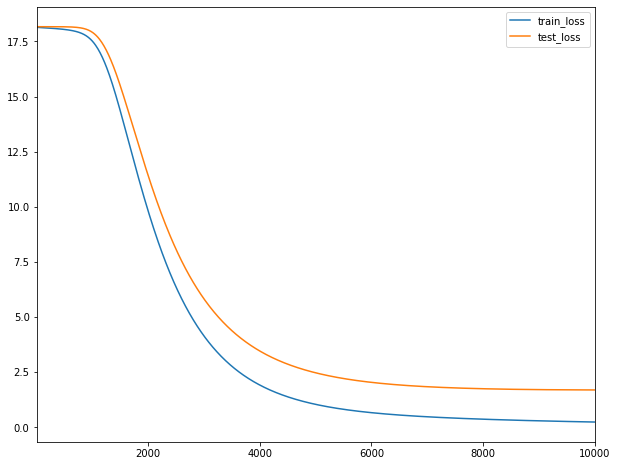

In [42]:
# Build the CF model and train it.
tf.random.set_seed(42)
np.random.seed(42)

model = build_model(ratings_df, embedding_dim=35, init_stddev=0.05)
model.train(num_iterations=10000, learning_rate=2.5)

# Inspecting the Embeddings

In this section, we take a closer look at the learned embeddings, by
- scoring our recommendations using dot and cosine scores
- looking at the nearest neighbors of 'Halo 4' item
- looking at the norms of the items embeddings,
- visualizing the embedding in a projected embedding space.

### Function that computes the scores of the candidates
We start by writing a function that, given a query embedding $u \in \mathbb R^d$ and item embeddings $V \in \mathbb R^{N \times d}$, computes the item scores.

There are different similarity measures we can use, and these can yield different results. We will compare the following:
- dot product: the score of item j is $\langle u, V_j \rangle$.
- cosine: the score of item j is $\frac{\langle u, V_j \rangle}{\|u\|\|V_j\|}$.

In [43]:
DOT = 'dot'
COSINE = 'cosine'

def compute_scores(query_embedding, item_embeddings, measure=DOT):
  """Computes the scores of the candidates given a query.
  Args:
    query_embedding: a vector of shape [k], representing the query embedding.
    item_embeddings: a matrix of shape [N, k], such that row i is the embedding
      of item i.
    measure: a string specifying the similarity measure to be used. Can be
      either DOT or COSINE.
  Returns:
    scores: a vector of shape [N], such that scores[i] is the score of item i.
  """
  u = query_embedding
  V = item_embeddings
  if measure == COSINE:
    V = V / np.linalg.norm(V, axis=1, keepdims=True)
    u = u / np.linalg.norm(u)
  # print(V.shape, u.shape)
  scores = tf.tensordot(u, tf.transpose(V), 1)
  # print(scores.shape)
  return scores.numpy()

Equipped with this function, we can compute recommendations, where the query embedding can be either a user embedding or a item embedding.

In [44]:
def item_neighbors(model, title_substring, measure=DOT, k=6):

  # Search for items ids that match the given substring.
  ids =  items_df[items_df['title'].str.startswith(title_substring)].index.values
  titles = items_df.iloc[ids]['title'].values
  if len(titles) == 0:
    raise ValueError("Found no items with title %s" % title_substring)

  print("Nearest neighbors of : %s." % titles[0])
  if len(titles) > 1:
    print("[Found more than one matching item. Other candidates: {}]".format(
        ", ".join(titles[1:])))
  item_id = ids[0] # take the first item from the list of matching items

  scores = compute_scores(
      model.embeddings["item_id"][item_id], model.embeddings["item_id"],
      measure)

  # print(len(scores))
  score_key = measure + ' score'

  df = pd.DataFrame({
      score_key: list(scores),
      'titles': items_df['title'],
      'category': items_df['category'],
      'ratings count': items_df['rating count'],
      'ratings mean': items_df['rating mean']
  })
  # display.display(df.head(10))
  display.display(df.sort_values([score_key], ascending=False).head(k))

### Video Games Nearest neighbors

Let's look at the neareast neighbors for 'Halo 4'

In [45]:
# Merge with items_ratings to get rating count, rating mean to show the problem with DOT score
items_df = items_df.merge(items_ratings[['itemID', 'rating count', 'rating mean']], how='left', on='itemID')

In [46]:
item_neighbors(model, "Halo 4 - Xbox", DOT)
item_neighbors(model, "Halo 4 - Xbox", COSINE)

Nearest neighbors of : Halo 4 - Xbox 360 (Standard Game).


2022-07-27 17:43:30.523400: I tensorflow/stream_executor/cuda/cuda_blas.cc:1786] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


,dot score,titles,category,ratings count,ratings mean
8659,25.678,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
7599,14.620,BioShock Infinite - Xbox 360,Toys & Games,163,4.307
8647,12.678,Unknown,Video Games,227,3.899
9350,12.468,"Developed by Rocksteady Studios, Batman: Arkha...",Video Games,101,4.752
7163,12.280,"With an Xbox LIVE Gold membership, take your X...",Gift Cards,465,4.753
8869,12.068,Turtle Beach - Ear Force X12 Amplified Stereo ...,Video Games,171,4.456


Nearest neighbors of : Halo 4 - Xbox 360 (Standard Game).


,cosine score,titles,category,ratings count,ratings mean
8659,1.000,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
7599,0.668,BioShock Infinite - Xbox 360,Toys & Games,163,4.307
9350,0.666,"Developed by Rocksteady Studios, Batman: Arkha...",Video Games,101,4.752
6850,0.665,Unknown,Video Games,13,2.923
6356,0.646,Singularity - Xbox 360,Video Games,43,3.837
7322,0.640,Tom Clancy's Ghost Recon: Future Soldier - Xbo...,Video Games,78,3.821


It seems that the quality of learned embeddings may not be very good. This will be addressed in Section V by adding several regularization techniques. First, we will further inspect the embeddings.

## Video Games Embedding Norm

We can  observe that the recommendations with dot-product and cosine are different: with dot-product, the model tends to recommend the more rated items. 

This can be explained by the fact that in matrix factorization models, the norm of the embedding is often correlated with popularity (popular items have a larger norm), which makes it more likely to recommend more popular items. We can confirm this hypothesis by sorting the items by their embedding norm, as done in the next cell.

In [49]:
def item_embedding_norm(models):
  """Visualizes the norm and number of ratings of the movie embeddings.
  Args:
    model: A MFModel object.
  """
  if not isinstance(models, list):
    models = [models]
  df = pd.DataFrame({
      'title': items_df['title'],
      'category': items_df['category'],
      'num_ratings': items_ratings['rating count'],
  })
  charts = []
  brush = alt.selection_interval()
  for i, model in enumerate(models):
    norm_key = 'norm'+str(i)
    df[norm_key] = np.linalg.norm(model.embeddings["item_id"], axis=1)
    nearest = alt.selection(
        type='single', encodings=['x', 'y'], on='mouseover', nearest=True,
        empty='none')
    base = alt.Chart().mark_circle().encode(
        x='num_ratings',
        y=norm_key,
        color=alt.condition(brush, alt.value('#4c78a8'), alt.value('lightgray'))
    ).properties(
        selection=nearest).add_selection(brush)
    text = alt.Chart().mark_text(align='center', dx=5, dy=-5).encode(
        x='num_ratings', y=norm_key,
        text=alt.condition(nearest, 'title', alt.value('')))
    charts.append(alt.layer(base, text))
  return alt.hconcat(*charts, data=df)

def visualize_item_embeddings(data, x, y):
  nearest = alt.selection(
      type='single', encodings=['x', 'y'], on='mouseover', nearest=True,
      empty='none')
  base = alt.Chart().mark_circle().encode(
      x=x,
      y=y,
      color=alt.condition(cat_filter, "category", alt.value("whitesmoke")),
  ).properties(
      width=600,
      height=600,
      selection=nearest)
  text = alt.Chart().mark_text(align='left', dx=5, dy=-5).encode(
      x=x,
      y=y,
      text=alt.condition(nearest, 'title', alt.value('')))
  return alt.hconcat(alt.layer(base, text), cat_chart, data=data)

def tsne_item_embeddings(model):
  """Visualizes the movie embeddings, projected using t-SNE with Cosine measure.
  Args:
    model: A MFModel object.
  """
  tsne = sklearn.manifold.TSNE(
      n_components=2, perplexity=40, metric='cosine', early_exaggeration=10.0,
      init='pca', verbose=True, n_iter=400)

  print('Running t-SNE...')
  V_proj = tsne.fit_transform(model.embeddings["item_id"])
  vidgames_df.loc[:,'x'] = V_proj[:, 0]
  vidgames_df.loc[:,'y'] = V_proj[:, 1]
  return visualize_game_embeddings(vidgames_df, 'x', 'y')

In [50]:
item_embedding_norm(model)

alt.HConcatChart(...)

Note: Depending on how the model is initialized, you may observe that some niche items (ones with few ratings) have a high norm, leading to spurious recommendations. This can happen if the embedding of that item happens to be initialized with a high norm. Then, because the item has few ratings, it is infrequently updated, and can keep its high norm. This will be alleviated by using regularization.

Try changing the value of the hyper-parameter `init_stddev`. One quantity that can be helpful is that the expected norm of a $d$-dimensional vector with entries $\sim \mathcal N(0, \sigma^2)$ is approximatley $\sigma \sqrt d$.

How does this affect the embedding norm distribution, and the ranking of the top-norm items?

# Hyperparameters search

1. Try a higher embedding dimension

 iteration 25000: train_loss=0.161122, test_loss=1.954998Nearest neighbors of : Halo 4 - Xbox 360 (Standard Game).


,dot score,titles,category,ratings count,ratings mean
8659,28.601,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
6325,12.125,Mass Effect 2 Platinum Hits,Video Games,241,4.606
7599,11.160,BioShock Infinite - Xbox 360,Toys & Games,163,4.307
9402,10.978,Call of Duty: Black Ops II - Xbox 360,Video Games,365,3.614
3865,10.911,Grand Theft Auto IV,Video Games,225,4.076
7946,10.824,Action RPG Meets First Person Shooter!!! Borde...,Video Games,73,4.479


Nearest neighbors of : Halo 4 - Xbox 360 (Standard Game).


,cosine score,titles,category,ratings count,ratings mean
8659,1.000,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
8788,0.613,Original Brand New Philips Lite-On DVD-ROM DG-...,Video Games,10,3.800
9341,0.586,"Aftermarket Thumbstick and Dpad set, RB and LB...",Video Games,5,3.600
9994,0.571,Xbox 360 Tomb Raider Limited Edition Wireless ...,Video Games,23,4.826
7220,0.566,HDE Battery Pack &amp; Charger Cable for Xbox ...,Video Games,16,3.750
5729,0.559,Rock Band 2 - Xbox 360 (Game only),Video Games,46,4.543


alt.HConcatChart(...)

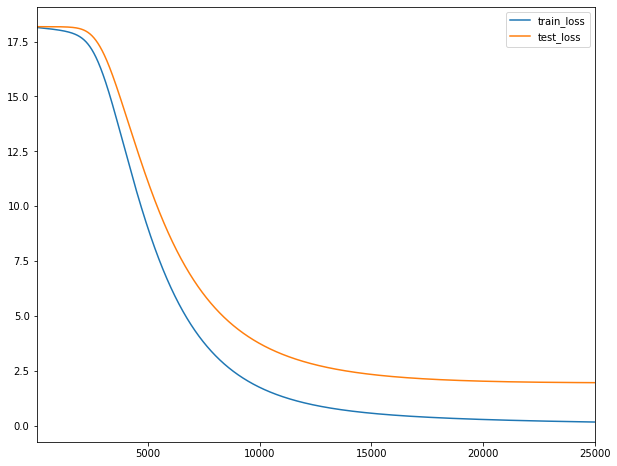

In [51]:
model_highdim = build_model(ratings_df, embedding_dim=60, init_stddev=0.05)
model_highdim.train(num_iterations=25000, learning_rate=1.)

item_neighbors(model_highdim, "Halo 4 - Xbox", DOT)
item_neighbors(model_highdim, "Halo 4 - Xbox", COSINE)

item_embedding_norm([model, model_highdim])

## Embedding visualization
Since it is hard to visualize embeddings in a higher-dimensional space (when the embedding dimension $k > 3$), one approach is to project the embeddings to a lower dimensional space. T-SNE (T-distributed Stochastic Neighbor Embedding) is an algorithm that projects the embeddings while attempting to preserve their pariwise distances. It can be useful for visualization, but one should use it with care. 

For more information on using t-SNE, see [How to Use t-SNE Effectively](https://distill.pub/2016/misread-tsne/).

In [52]:
# NOTE: we don't have too many categories

# tsne_item_embeddings(model_highdim)

# You can highlight the embeddings of a given category by clicking on the categories panel 
# (SHIFT+click to select multiple categories).

# We can observe that the embeddings do not seem to have any notable structure, 
# and the embeddings of a given category are located all over the embedding space. This confirms the poor
# quality of the learned embeddings.

This confirms the poor quality of the learned embeddings. One of the main reasons, <b>which we will address in the next section, is that we only trained the model on observed pairs, and without regularization</b>.

# Regularization In Matrix Factorization

In the previous section, our loss was defined as the mean squared error on the observed part of the rating matrix.  As discussed in the lecture, this can be problematic as the model does not learn how to place the embeddings of irrelevant items. This phenomenon is known as <b>*folding*</b>.

We will add regularization terms that will address this issue. We will use two types of regularization:
- Regularization of the model parameters. This is a common $\ell_2$ regularization term on the embedding matrices, given by $r(U, V) =  \frac{1}{N} \sum_i \|U_i\|^2 + \frac{1}{M}\sum_j \|V_j\|^2$.
- A global prior that pushes the prediction of any pair towards zero, called the *gravity* term. This is given by $g(U, V) = \frac{1}{MN} \sum_{i = 1}^N \sum_{j = 1}^M \langle U_i, V_j \rangle^2$.

The total loss is then given by
$$
\frac{1}{|\Omega|}\sum_{(i, j) \in \Omega} (A_{ij} - \langle U_i, V_j\rangle)^2 + \lambda _r r(U, V) + \lambda_g g(U, V)
$$
where $\lambda_r$ and $\lambda_g$ are two regularization coefficients (hyper-parameters).

### Build a regularized Matrix Factorization model using TensorFlow 2.x and train it

Write a function that builds a regularized model. 

The function `gravity(U, V)` that computes the gravity term given the two embedding matrices $U$ and $V$.

In [53]:
class CFModel2(object):
  """Simple class that represents a collaborative filtering model"""
  def __init__(self, embedding_vars, A_train, A_test, reg_coeff, gravity_coeff):
    """Initializes a CFModel.
    Args:
      embedding_vars: A dictionary of tf.Variables.
      loss: A float Tensor. The loss to optimize.
      metrics: optional list of dictionaries of Tensors. The metrics in each
        dictionary will be plotted in a separate figure during training.
    """
    self._embedding_vars = embedding_vars # {"user_id": U, "movie_id": V}
    self._a_train = A_train
    self._a_test = A_test
    self.reg_coeff = reg_coeff
    self.gravity_coeff = gravity_coeff
    self._embeddings = {k: None for k in embedding_vars}

  @property
  def embeddings(self):
    """The embeddings dictionary."""
    return self._embeddings

  def train(self, num_iterations=100, learning_rate=1.0, plot_results=True,
            optimizer=tf.keras.optimizers.SGD):
    """Trains the model.
    Args:
      iterations: number of iterations to run.
      learning_rate: optimizer learning rate.
      plot_results: whether to plot the results at the end of training.
      optimizer: the optimizer to use. Default to GradientDescentOptimizer.
    Returns:
      The metrics dictionary evaluated at the last iteration.
    """

    opt = optimizer(learning_rate)

    iterations = []
    metrics_vals = [collections.defaultdict(list) for _ in ['train_loss', 'test_loss', 
                                                            'gravity_loss', 'reg_loss']]

    # Train and append results.
    results = {}
    for i in range(num_iterations + 1):
      with tf.GradientTape() as tape:
        U = self._embedding_vars['user_id']
        V = self._embedding_vars['item_id']
        train_loss = sparse_mean_square_error(self._a_train, U, V)
        gravity_loss = self.gravity_coeff * gravity(U, V)
        regularization_loss = self.reg_coeff * (
            tf.reduce_sum(U*U)/U.shape[0] + tf.reduce_sum(V*V)/V.shape[0])
        total_loss = train_loss + gravity_loss + regularization_loss
        
      gradients = tape.gradient(total_loss, 
                                [self._embedding_vars['user_id'], self._embedding_vars['item_id']])
      opt.apply_gradients(zip(gradients, 
                              [self._embedding_vars['user_id'], self._embedding_vars['item_id']]))

      test_loss = sparse_mean_square_error(self._a_test, self._embedding_vars['user_id'],
                                                         self._embedding_vars['item_id'])
      results['train_loss'] = train_loss
      results['test_loss'] = test_loss
      results['gravity_loss'] = gravity_loss
      results['reg_loss'] = regularization_loss
      if (i % 10 == 0) or i == num_iterations:
          print("\r iteration %d: " % i + ", ".join(
                ["%s=%f" % (k, v) for k, v in results.items()]),
                end='')
          iterations.append(i)
          for j, (k, v) in enumerate(results.items()):
            metrics_vals[j][k].append(v)

      for k, v in self._embedding_vars.items():
        self._embeddings[k] = v

    if plot_results:
        # Plot the metrics.
        fig = plt.figure()
        fig.set_size_inches(10, 8)
        ax = fig.add_subplot(1, 1, 1)
        for i, metric_vals in enumerate(metrics_vals):
          for k, v in metric_vals.items():
            ax.plot(iterations, v, label=k)
        ax.set_xlim([1, num_iterations])
        ax.legend()
    return results

In [54]:
# @title Solution
def gravity(U, V):
  """Creates a gravity loss given two embedding matrices."""
  return 1. / (U.shape[0]*V.shape[0]) * tf.reduce_sum(
      tf.matmul(U, U, transpose_a=True) * tf.matmul(V, V, transpose_a=True))

def build_regularized_model(
    ratings, embedding_dim=3, regularization_coeff=.1, gravity_coeff=1.,
    init_stddev=0.1):
  """
  Args:
    ratings: the DataFrame of movie ratings.
    embedding_dim: The dimension of the embedding space.
    regularization_coeff: The regularization coefficient lambda.
    gravity_coeff: The gravity regularization coefficient lambda_g.
  Returns:
    A CFModel object that uses a regularized loss.
  """
  # Split the ratings DataFrame into train and test.
  train_ratings, test_ratings = split_dataframe(ratings)
  # SparseTensor representation of the train and test datasets.
  A_train = build_rating_sparse_tensor(train_ratings)
  A_test = build_rating_sparse_tensor(test_ratings)
  U = tf.Variable(tf.random.normal(
      [A_train.dense_shape[0], embedding_dim], stddev=init_stddev))
  V = tf.Variable(tf.random.normal(
      [A_train.dense_shape[1], embedding_dim], stddev=init_stddev))

  embeddings = {"user_id": U, "item_id": V}

  return CFModel2(embeddings, A_train, A_test, regularization_coeff, gravity_coeff)

# Hyperparameters

1. embedding dimension
2. learning rate
3. regularization coefficient
4. gravity coefficient
5. iterations

It is now time to train the regularized model! We can try different values of the regularization coefficients, and different embedding dimensions.

 iteration 20000: train_loss=1.117519, test_loss=4.032150, gravity_loss=1.136254, reg_loss=0.7596081

{'train_loss': <tf.Tensor: shape=(), dtype=float32, numpy=1.1175185>,
 'test_loss': <tf.Tensor: shape=(), dtype=float32, numpy=4.03215>,
 'gravity_loss': <tf.Tensor: shape=(), dtype=float32, numpy=1.1362536>,
 'reg_loss': <tf.Tensor: shape=(), dtype=float32, numpy=0.7596076>}

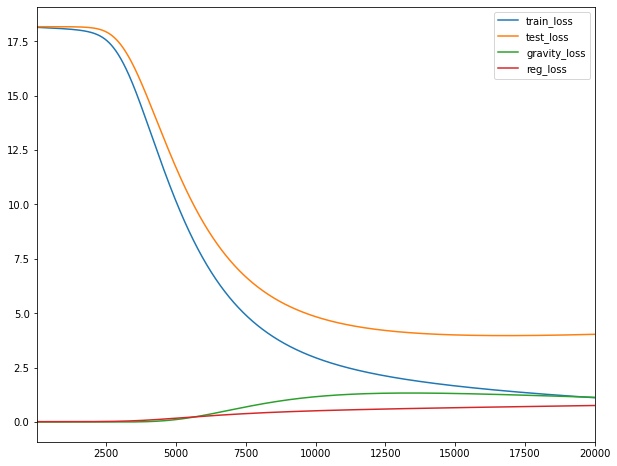

In [55]:
tf.random.set_seed(42)
np.random.seed(42)

reg_model = build_regularized_model(
    ratings_df, regularization_coeff=0.1, gravity_coeff=0.5, embedding_dim=35,
    init_stddev=.05)
reg_model.train(num_iterations=20000, learning_rate=1.)

## Effects of adding regularization

- Observe that adding the regularization terms results in a higher MSE, both on the training and test set.

- However, the quality of the recommendations improves. This highlights a tension between fitting the observed data and minimizing the regularization terms.

- Fitting the observed data often emphasizes learning high similarity (between items with many interactions), but a good embedding representation also requires learning low similarity (between items with few or no interactions).

### Inspect the results
Let's see if the results with regularization look better.

Hopefully, these recommendations look better.

In the following cells, we display the nearest neighbors, the embedding norms, and the t-SNE projection of the item embeddings.

In [56]:
item_neighbors(reg_model, "Halo 4 - Xbox", DOT)
item_neighbors(reg_model, "Halo 4 - Xbox", COSINE)

Nearest neighbors of : Halo 4 - Xbox 360 (Standard Game).


,dot score,titles,category,ratings count,ratings mean
8659,24.983,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
7599,15.879,BioShock Infinite - Xbox 360,Toys & Games,163,4.307
9350,13.979,"Developed by Rocksteady Studios, Batman: Arkha...",Video Games,101,4.752
8647,13.964,Unknown,Video Games,227,3.899
8656,13.943,Far Cry 3,Video Games,191,4.440
8869,13.858,Turtle Beach - Ear Force X12 Amplified Stereo ...,Video Games,171,4.456


Nearest neighbors of : Halo 4 - Xbox 360 (Standard Game).


,cosine score,titles,category,ratings count,ratings mean
8659,1.000,Halo 4 - Xbox 360 (Standard Game),Video Games,441,4.306
6850,0.744,Unknown,Video Games,13,2.923
7322,0.729,Tom Clancy's Ghost Recon: Future Soldier - Xbo...,Video Games,78,3.821
8921,0.728,JINHEZO Sensor TV Mount Clip for Xbox 360 Kinect,Video Games,11,4.182
6356,0.728,Singularity - Xbox 360,Video Games,43,3.837
9642,0.723,Battlefield 3 Premium Edition -Xbox 360,Video Games,33,4.576


Here we compare the embedding norms for `model` and `reg_model`. Selecting a subset of the embeddings will highlight them on both charts simultaneously.

In [57]:
item_embedding_norm([model, model_highdim, reg_model])

alt.HConcatChart(...)

In [46]:
# Visualize the embeddings
# tsne_item_embeddings(reg_model)

### Conclusion

Note that while the scale of the problem is small enough to allow efficient training using SGD, many practical problems need to be trained using more specialized algorithms such as Alternating Least Squares (see [tf.contrib.factorization.WALSMatrixFactorization]
(https://www.tensorflow.org/api_docs/python/tf/contrib/factorization/WALSMatrixFactorization) for a TF implementation).